In [17]:
import xarray as xr
import matplotlib.pyplot as plt

In [18]:
from dask.distributed import Client, LocalCluster

cluster = LocalCluster(
    n_workers=16,
    threads_per_worker=1,
    memory_limit="4GB",
)

/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44893 instead
  warnings.warn(


In [19]:
ds_raw_bt = xr.open_dataset('/projekt_agmwend/home_rad/Joshua/HALO-AC3_VELOX_sea_ice/2022-03-20_v_0.1.zarr', engine='zarr', chunks='auto')
ds_raw_sel = ds_raw_bt.sel(time=slice('2022-03-20T10:51:30', '2022-03-20T10:53:30')).load()

ds_snow_covered = ds_raw_sel.mean(dim='time').compute()

/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "band" starting at index 4. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)
/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "time" starting at index 202. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanager)
/home/jomueller/micromamba/envs/mamba_josh/lib/python3.12/site-packages/xarray/backends/api.py:365: UserWarning: The specified chunks separate the stored chunks along dimension "x" starting at index 202. This could degrade performance. Instead, consider rechunking after loading.
  var_chunks = _get_chunk(var, chunks, chunkmanage

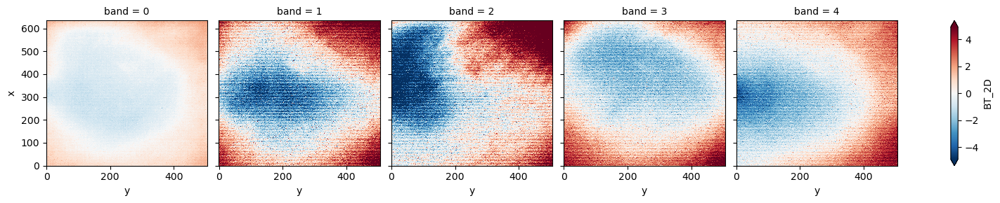

In [20]:
(ds_snow_covered.BT_2D - ds_snow_covered.BT_2D.mean(['x', 'y'])).plot(col='band', col_wrap=5, robust=True)

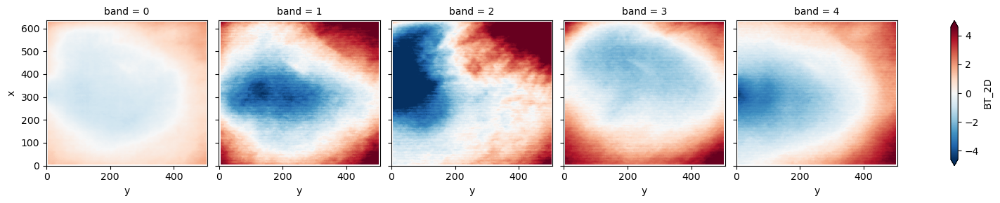

In [21]:
(ds_snow_covered.BT_2D - ds_snow_covered.BT_2D.median(['x', 'y'])).rolling(x=10, y=10, center=True).median().plot(col='band', col_wrap=5, robust=True)

In [22]:
ds_snow_covered.BT_2D.isel(band=0)

def z_normalize(ds):
    return (ds - ds.mean()) / ds.std()

def min_max_normalize(ds):
    return (ds - ds.min()) / (ds.max() - ds.min())  

ds_snow_covered_z = z_normalize(ds_snow_covered)
ds_snow_covered_mm = min_max_normalize(ds_snow_covered_z)

correction = ds_snow_covered - ds_snow_covered.mean(['x', 'y'])
correction2 = (ds_snow_covered.BT_2D - ds_snow_covered.BT_2D.median(['x', 'y'])).rolling(x=10, y=10, center=True).median()

In [23]:
ds_corr = ds_raw_bt - correction

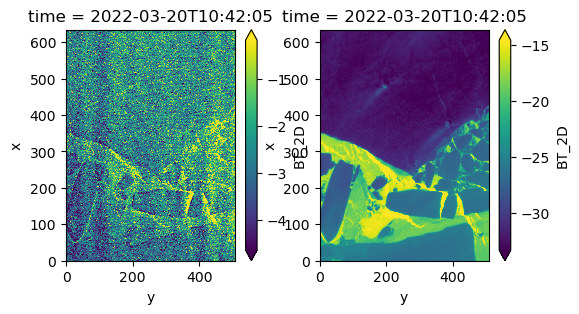

In [24]:
showtime = '2022-03-20T10:42:05'

BT56 = ds_corr.BT_2D.sel(time=showtime, band=3) - ds_corr.BT_2D.sel(time=showtime, band=4)

fig, ax = plt.subplots(1, 2, figsize=(6, 3))

BT56.plot(ax=ax[0], robust=True)
ds_corr.BT_2D.isel(band=0).sel(time=showtime).plot(ax=ax[1], robust=True)



In [25]:
import pandas as pd

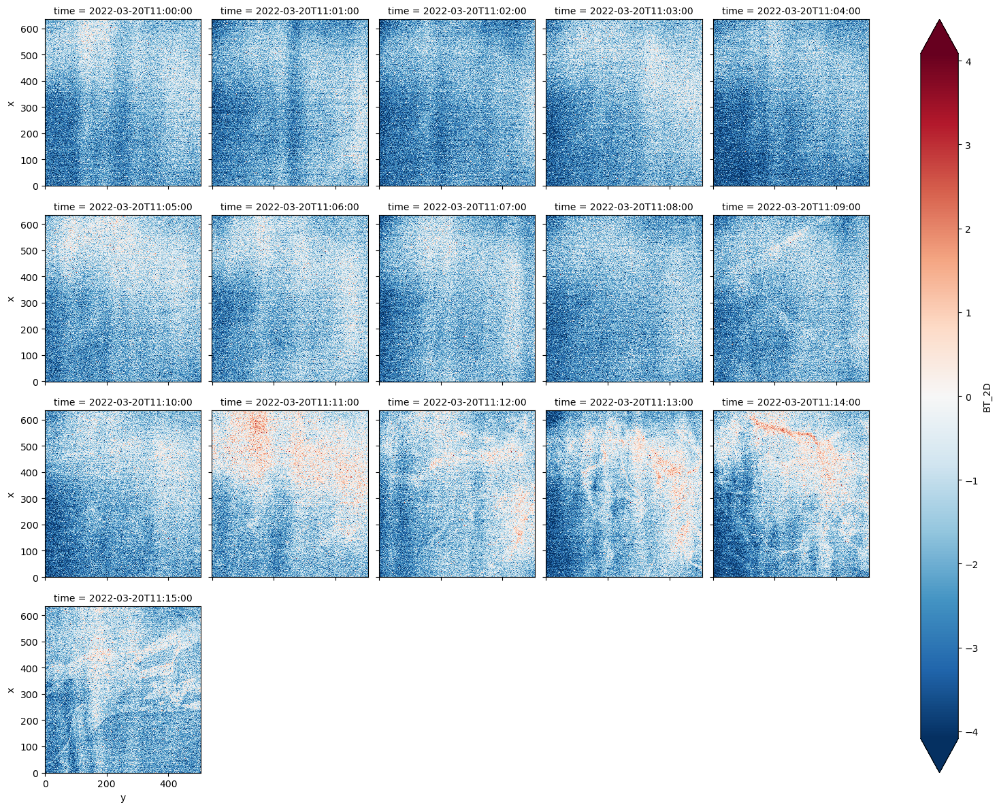

In [26]:
showtime_start = '2022-03-20T11:00:00'
showtime_end = '2022-03-20T11:15:00'
times = pd.date_range(showtime_start, showtime_end, freq='60s')

BT56 = ds_corr.BT_2D.sel(time=times, band=3) - ds_corr.BT_2D.sel(time=times, band=4)

BT56.plot(col='time', col_wrap=5, robust=True)


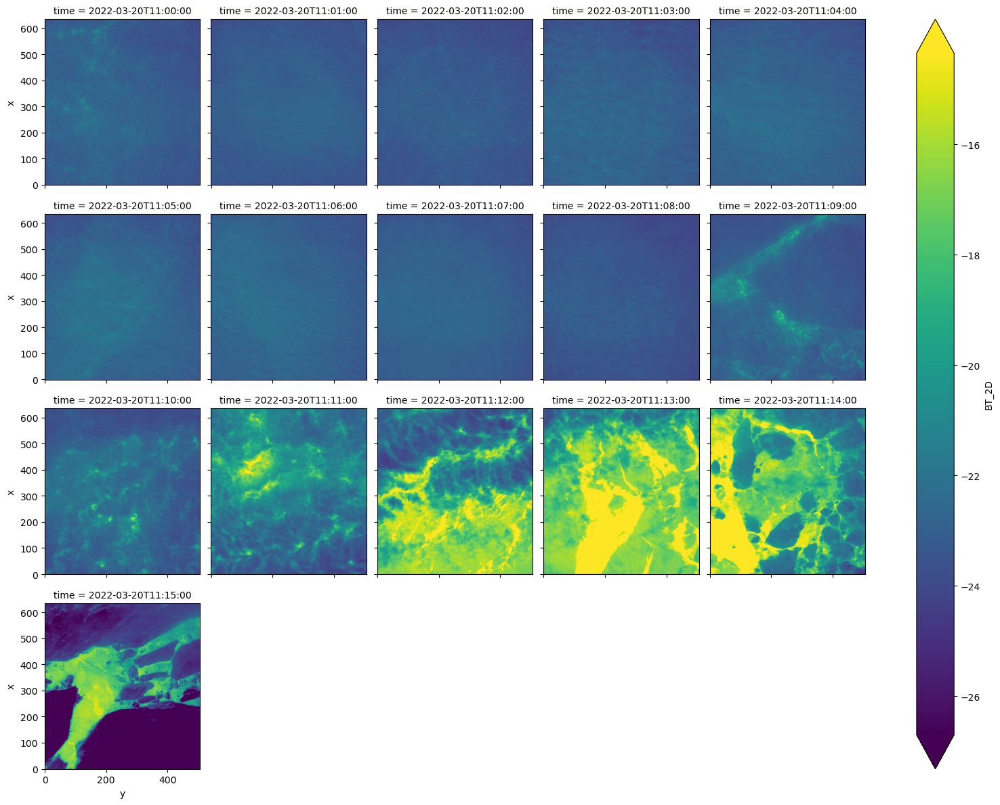

In [27]:
ds_corr.BT_2D.isel(band=0).sel(time=times).plot(col='time', col_wrap=5, robust=True)


In [28]:
showtime = '2022-03-20T10:42:05'
showtime_slice = slice('2022-03-20T11:00:00', '2022-03-20T11:15:00')

BT56 = ds_corr.BT_2D.sel(band=3, time=showtime_slice) - ds_corr.BT_2D.sel(band=4, time=showtime_slice).compute()
BT35 = ds_corr.BT_2D.sel(band=2, time=showtime_slice) - ds_corr.BT_2D.sel(band=4, time=showtime_slice).compute()
BT25 = ds_corr.BT_2D.sel(band=1, time=showtime_slice) - ds_corr.BT_2D.sel(band=4, time=showtime_slice).compute()
#BT56.hvplot.image(x='x', y='y', cmap='viridis')

In [29]:
from velox_tools.processing import pushbroom

In [30]:
BT56

<xarray.DataArray 'BT_2D' (time: 901, x: 635, y: 507)> Size: 1GB
dask.array<sub, shape=(901, 635, 507), dtype=float32, chunksize=(202, 202, 202), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 7kB 2022-03-20T11:00:00 ... 2022-03-20T11:...
Dimensions without coordinates: x, y

In [31]:
ds_cc = pushbroom(ds_corr.sel(time=showtime_slice))

ValueError: conflicting sizes for dimension 'time': length 0 on 'time' and length 19261 on {'band': 'BT_2D', 'y': 'BT_2D', 'time': 'BT_2D'}

In [32]:
ds_BT56_cc = pushbroom(BT56.to_dataset(name='BT56'))
ds_BT35_cc = pushbroom(BT35.to_dataset(name='BT35'))
ds_BT25_cc = pushbroom(BT25.to_dataset(name='BT25'))

Executed pushbroom in 3.5209 seconds
Executed pushbroom in 3.4384 seconds
Executed pushbroom in 3.4472 seconds


In [33]:
ds_BT1_cc = pushbroom(ds_corr.sel(time=showtime_slice).BT_2D.sel(band=0).to_dataset(name='BT1'))
ds_BT2_cc = pushbroom(ds_corr.sel(time=showtime_slice).BT_2D.sel(band=1).to_dataset(name='BT2'))
ds_BT3_cc = pushbroom(ds_corr.sel(time=showtime_slice).BT_2D.sel(band=2).to_dataset(name='BT3'))
ds_BT5_cc = pushbroom(ds_corr.sel(time=showtime_slice).BT_2D.sel(band=3).to_dataset(name='BT5'))
ds_BT6_cc = pushbroom(ds_corr.sel(time=showtime_slice).BT_2D.sel(band=4).to_dataset(name='BT6'))

Executed pushbroom in 3.2072 seconds
Executed pushbroom in 3.2353 seconds
Executed pushbroom in 3.2706 seconds
Executed pushbroom in 3.1384 seconds
Executed pushbroom in 3.0959 seconds


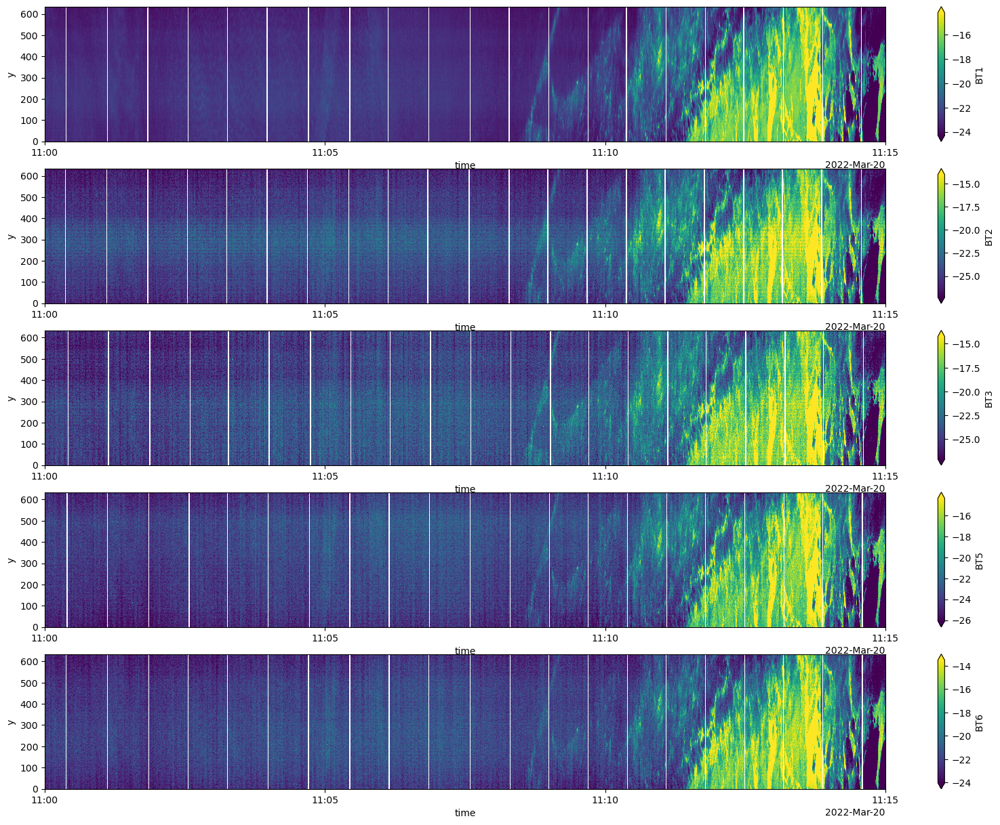

In [34]:
fig, ax = plt.subplots(5, figsize=(20, 15))

ds_BT1_cc.BT1.plot(ax=ax[0], robust=True)
ds_BT2_cc.BT2.plot(ax=ax[1], robust=True)
ds_BT3_cc.BT3.plot(ax=ax[2], robust=True)
ds_BT5_cc.BT5.plot(ax=ax[3], robust=True)
ds_BT6_cc.BT6.plot(ax=ax[4], robust=True)


In [ ]:
ds_BT1_cc.mean('time').BT1 - ds_BT1_cc.BT1.mean()

<xarray.DataArray 'BT1' (y: 635)> Size: 3kB
array([ 0.10655975,  0.05975151,  0.04590607,  0.0645504 ,  0.06784058,
        0.03714561,  0.04310989,  0.048666  ,  0.06178665,  0.04339409,
        0.02444077,  0.03133965,  0.04545593,  0.02229881,  0.01796913,
        0.02976608,  0.04922485,  0.05049706,  0.06228638,  0.06626511,
        0.12353325,  0.08940887,  0.083498  ,  0.12051201,  0.11265755,
        0.1049366 ,  0.10505295,  0.13366318,  0.12261391,  0.1278305 ,
        0.1256504 ,  0.15899277,  0.17717743,  0.15208817,  0.15449905,
        0.14821243,  0.15402412,  0.13809776,  0.12306976,  0.13667679,
        0.1821003 ,  0.150177  ,  0.16085052,  0.18286133,  0.14809418,
        0.16906738,  0.16540527,  0.20314598,  0.21863747,  0.20521927,
        0.20338249,  0.24215698,  0.2377758 ,  0.23256493,  0.24463654,
        0.25473404,  0.24687576,  0.21117401,  0.20615005,  0.23802948,
        0.20915794,  0.16386032,  0.19778061,  0.2263012 ,  0.20259666,
        0.23291779,  0.24202347,  0.28289795,  0.2725048 ,  0.25076485,
        0.24700928,  0.25039482,  0.23138237,  0.19504547,  0.1953659 ,
        0.2077198 ,  0.1818161 ,  0.15685654,  0.18270111,  0.19233322,
        0.16802979,  0.14775276,  0.17819405,  0.20401573,  0.17651558,
        0.15998459,  0.15040779,  0.16395569,  0.17192268,  0.15017319,
        0.15784454,  0.19806862,  0.1504612 ,  0.18055916,  0.17754745,
        0.20988655,  0.18855095,  0.1540451 ,  0.18886566,  0.23394775,
...
       -0.6444607 , -0.66921234, -0.66508865, -0.6557522 , -0.68766785,
       -0.69468117, -0.66218376, -0.6573391 , -0.6799545 , -0.6880932 ,
       -0.67069054, -0.6869869 , -0.68798447, -0.6964798 , -0.6981125 ,
       -0.70599365, -0.767025  , -0.71445656, -0.68237495, -0.69540405,
       -0.7119236 , -0.7374592 , -0.7318058 , -0.7153034 , -0.73091125,
       -0.77716255, -0.7671795 , -0.7526512 , -0.7672596 , -0.81944466,
       -0.7794609 , -0.7872639 , -0.8097706 , -0.82354736, -0.79338646,
       -0.80747604, -0.8137703 , -0.83379364, -0.80867195, -0.78632164,
       -0.8086662 , -0.82629204, -0.8294182 , -0.8117008 , -0.8202629 ,
       -0.83413696, -0.8246727 , -0.8378315 , -0.86115646, -0.86826134,
       -0.83551025, -0.8600807 , -0.85560226, -0.9064903 , -0.89793205,
       -0.8674259 , -0.87958336, -0.896492  , -0.9175129 , -0.9081497 ,
       -0.9177208 , -0.9404831 , -0.91513634, -0.91283417, -0.91607475,
       -0.9763851 , -0.926569  , -0.9304676 , -0.9141884 , -0.9424114 ,
       -0.946661  , -0.91625404, -0.94067955, -0.99261665, -0.9402733 ,
       -0.9455967 , -0.9692383 , -0.97415924, -0.95435905, -0.9608097 ,
       -0.9981098 , -1.0352459 , -1.0061226 , -1.031744  , -1.0515366 ,
       -1.0872116 , -1.0609989 , -1.0771465 , -1.0777321 , -1.1142826 ,
       -1.0986404 , -1.0783596 , -1.1130104 , -1.1355839 , -1.0872326 ],
      dtype=float32)
Coordinates:
  * y        (y) int64 5kB 0 1 2 3 4 5 6 7 8 ... 627 628 629 630 631 632 633 634

In [ ]:
plt.rcParams.update({'font.size': 16, 'figure.dpi': 300})

fig, ax = plt.subplots(4, figsize=(20, 12))

ds_BT1_cc.BT1.plot(ax=ax[0], robust=True)
ds_BT25_cc.BT25.plot(ax=ax[1], robust=True)
ds_BT35_cc.BT35.plot(ax=ax[2], robust=True)
ds_BT56_cc.BT56.plot(ax=ax[3], robust=True)